# Test transforms

In [21]:
import torch
import torchvision
from torchvision.io import read_image, read_video
import torchvision.transforms.functional as TF
from workoutdetector.datasets import ThreeCrop, PersonCrop
import matplotlib.pyplot as plt
import numpy as np
import einops
from torch import Tensor
import random

In [2]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [3]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (8, 5)
plt.rcParams['figure.autolayout'] = True
plt.style.use('seaborn-pastel')
plt.rcParams['grid.alpha'] = 0

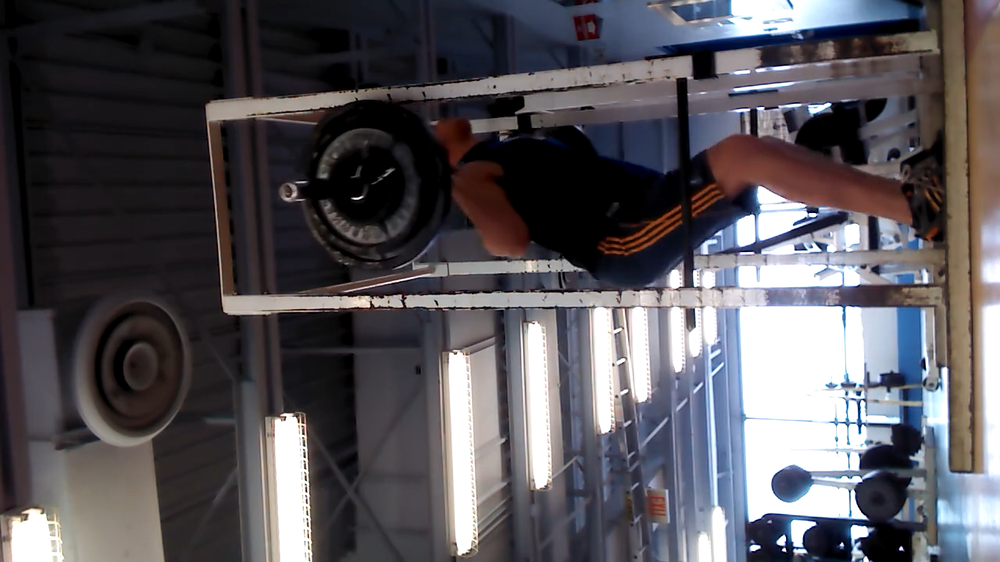

In [55]:
img = read_image('../tmp/test.png')
img_t = img.transpose(1, 2)
pil_img = TF.to_pil_image(img_t)
pil_img

In [5]:
three_crop = ThreeCrop()(img)
three_crop_t = ThreeCrop()(img_t)
three_crop.shape

torch.Size([3, 720, 720])

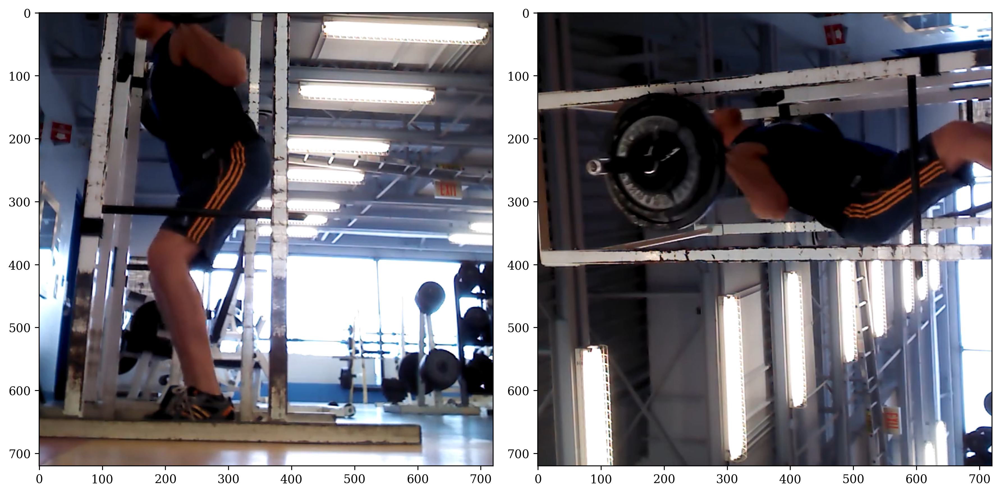

In [6]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(TF.to_pil_image(three_crop))
ax[1].imshow(TF.to_pil_image(three_crop_t))

plt.show()

## PersonCrop

In [7]:
from workoutdetector.datasets.transform import Detector

In [8]:
det = Detector()

In [9]:
print(img.shape)
box_tensor = det.detect(TF.convert_image_dtype(img, torch.float32))[:, 0]
box_tensor

torch.Size([3, 1280, 720])


tensor([[ 119.2578,  478.0018,  365.2753, 1199.4677]], device='cuda:0')

In [10]:
min_x1, min_y1 = box_tensor[:, 0].min().item(), box_tensor[:, 1].min().item()
max_x2, max_y2 = box_tensor[:, 2].max().item(), box_tensor[:, 3].max().item()
min_x1, min_y1, max_x2, max_y2 = int(min_x1), int(min_y1), int(max_x2), int(max_y2)
w, h = max_x2 - min_x1, max_y2 - min_y1
print(min_x1, min_y1, w, h)


119 478 246 721


In [11]:
crop_img = TF.crop(img, min_y1, min_x1, h, w)
print(crop_img.shape)

torch.Size([3, 721, 246])


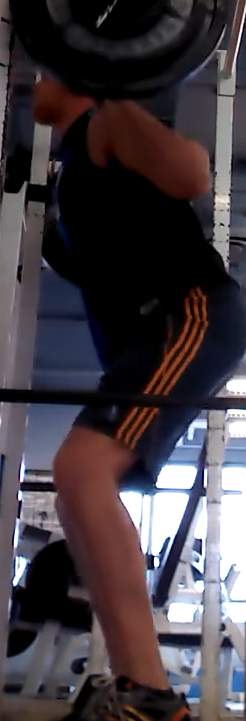

In [12]:
TF.to_pil_image(crop_img)

In [13]:
person_cropper = PersonCrop()
person_crop = person_cropper(TF.convert_image_dtype(img, torch.float32))
person_crop_t = person_cropper(TF.convert_image_dtype(img_t, torch.float32))

In [14]:
person_crop_pil = TF.to_pil_image(person_crop)
person_crop_t_pil = TF.to_pil_image(person_crop_t)
person_crop_pil.size

(270, 793)

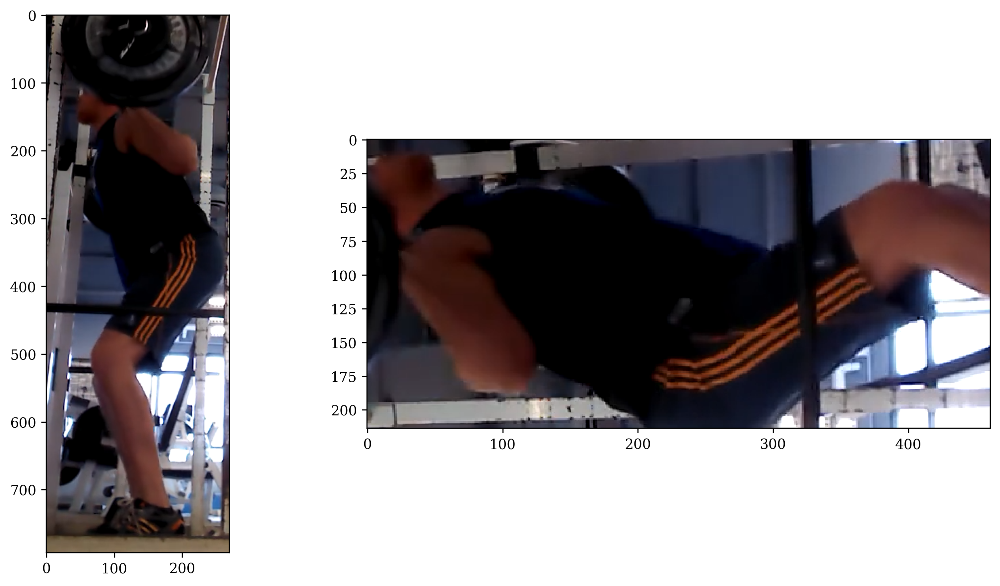

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(person_crop_pil)
ax[1].imshow(person_crop_t_pil)

## Test PersonCrop with no person

In [16]:
im = torch.randn(3,400, 400)
crop_im = person_cropper(im)
crop_im.shape

torch.Size([3, 400, 400])

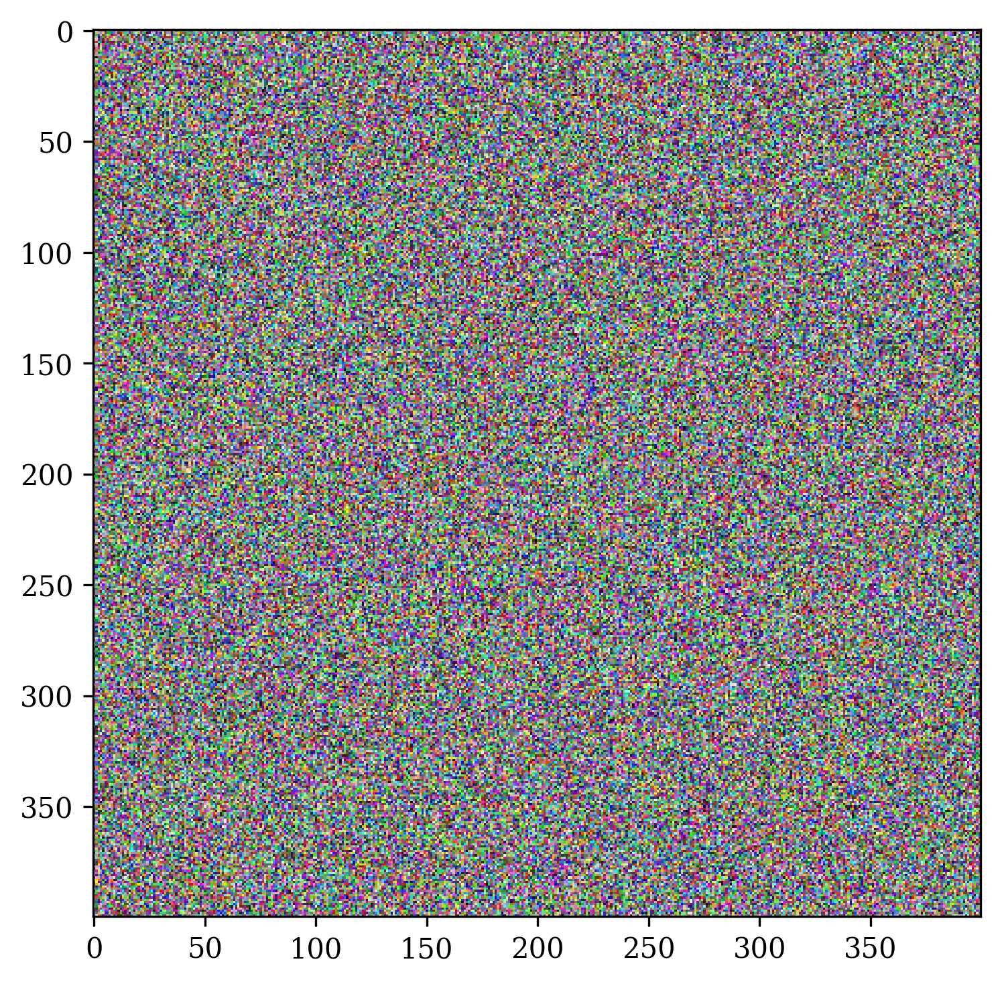

In [17]:
plt.imshow(TF.to_pil_image(crop_im))

# Test MultiScaleCrop

In [18]:
from workoutdetector.datasets.transform import MultiScaleCrop

In [26]:
msc = MultiScaleCrop(scales=(1.0, 0.8, 0.75, 0.66))

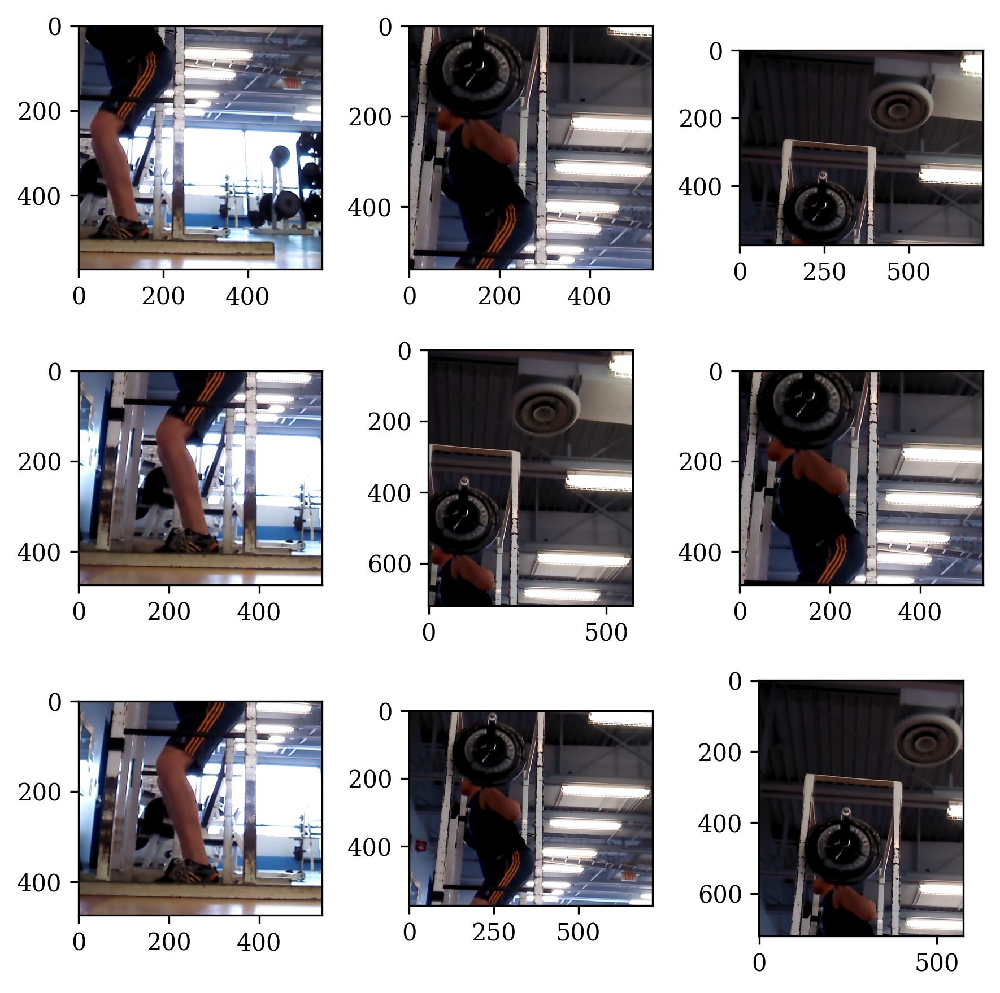

In [27]:
fig, ax = plt.subplots(3, 3, figsize=(6, 6))
for i in range(9):
    crop_im = msc(img)
    ax[i // 3, i % 3].imshow(TF.to_pil_image(crop_im))

# Test build_transform

In [23]:
from workoutdetector.datasets import  build_dataset
from fvcore.common.config import CfgNode
import torch
import torchvision.transforms as T
import numpy as np


In [24]:
cfg = CfgNode(new_allowed=True)
cfg.merge_from_file('../workoutdetector/configs/tsm.yaml')


In [64]:
dataset = build_dataset(cfg.data, 'test')
img, label = dataset[0]
print(img.shape)

torch.Size([8, 3, 224, 224])


In [65]:
img

tensor([[[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

         [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

         [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
          [-1.8044, -1.8044, -

In [50]:
compose = T.Compose([
T.ConvertImageDtype(torch.float32),
T.Resize(256),
T.RandomCrop(224),
T.RandomHorizontalFlip(),
# T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

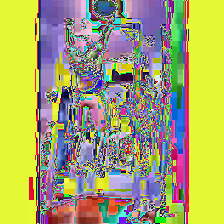

In [49]:
p = T.ToPILImage()(img[0])
p

In [56]:
torch.equal(T.PILToTensor()(p), img)

False

In [57]:
x = compose(img)
x

tensor([[[0.3289, 0.3258, 0.3289,  ..., 0.0259, 0.0275, 0.0306],
         [0.2837, 0.2823, 0.2851,  ..., 0.0117, 0.0196, 0.0235],
         [0.2642, 0.2548, 0.2559,  ..., 0.0016, 0.0100, 0.0100],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.2940, 0.2507, 0.1864],
         [0.6511, 0.9790, 1.0000,  ..., 0.2095, 0.2166, 0.1762],
         [0.1140, 0.0965, 0.9970,  ..., 0.1978, 0.2136, 0.1789]],

        [[0.2917, 0.2889, 0.2868,  ..., 0.0259, 0.0275, 0.0306],
         [0.2549, 0.2549, 0.2537,  ..., 0.0117, 0.0196, 0.0235],
         [0.2404, 0.2384, 0.2336,  ..., 0.0016, 0.0100, 0.0100],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.2314, 0.2074, 0.1652],
         [0.7017, 1.0000, 1.0000,  ..., 0.1616, 0.1778, 0.1599],
         [0.1533, 0.2189, 1.0000,  ..., 0.1507, 0.1788, 0.1605]],

        [[0.2618, 0.2590, 0.2569,  ..., 0.0290, 0.0275, 0.0306],
         [0.2431, 0.2431, 0.2409,  ..., 0.0179, 0.0196, 0.0235],
         [0.2287, 0.2267, 0.2222,  ..., 0.0046, 0.0100, 0.

In [66]:
l = [T.ToPILImage()(_) for _ in img]
l

[<PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>,
 <PIL.Image.Image image mode=RGB size=224x224>]

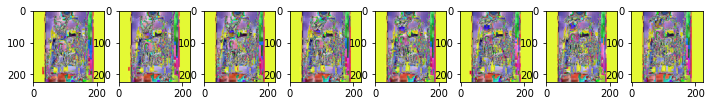

In [67]:
fig, ax = plt.subplots(1, len(l), figsize=(12, 6))
for i, _ in enumerate(l):
    ax[i].imshow(_)